In [1]:
import torch 
torch.cuda.is_available()          

True

In [1]:
!gpustat

user                 Mon Oct 23 23:58:42 2023  470.82.01
[0] Quadro RTX 4000  | 41'C,   0 % |   195 /  7979 MB | gdm(39M) user(82M) user(55M)


In [2]:
import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

model_id = "runwayml/stable-diffusion-v1-5"
pipeline = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipeline = pipeline.to("cuda")
generator = torch.Generator("cuda").manual_seed(0)

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [2]:
prompt = "task : we are making omelet reciepe reciepe step is BEAT eggs, water, salt and pepper in small bowl until blended"

In [3]:
from PIL import Image
def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid


In [4]:
def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

In [5]:
pipeline.enable_attention_slicing()

In [7]:
!gpustat

user                 Tue Oct 24 00:01:57 2023  470.82.01
[0] Quadro RTX 4000  | 41'C,   0 % |  7551 /  7979 MB | elidandi_2211ai08(7353M) gdm(39M) user(82M) user(55M)


  0%|          | 0/20 [00:00<?, ?it/s]

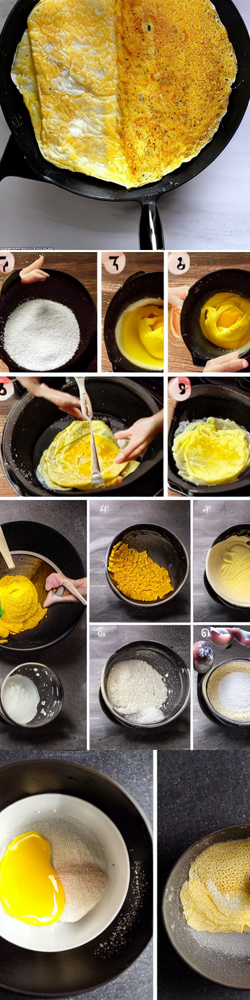

In [22]:
images = pipeline(**get_inputs(batch_size=4)).images
image_grid(images, rows=4, cols=1)

  0%|          | 0/20 [00:00<?, ?it/s]

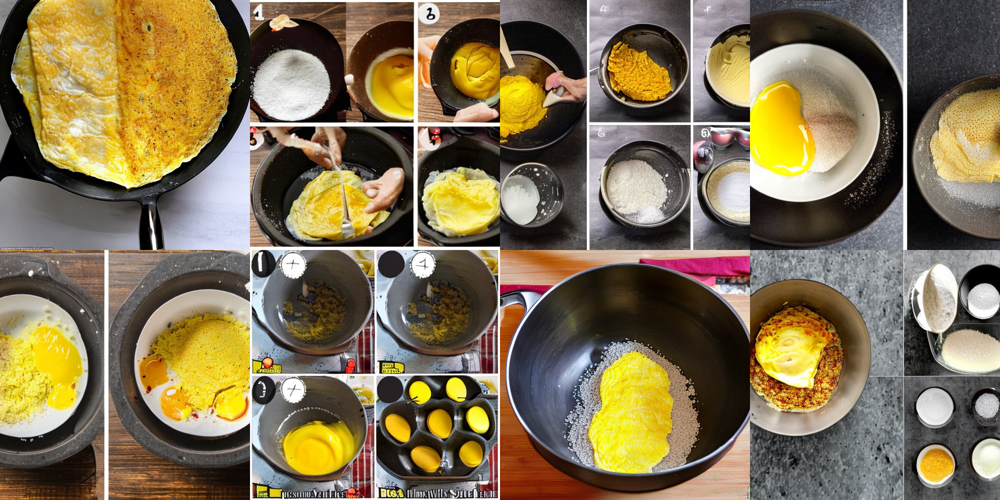

In [8]:
from diffusers import AutoencoderKL

vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=torch.float16).to("cuda")
pipeline.vae = vae
images = pipeline(**get_inputs(batch_size=8)).images
image_grid(images, rows=2, cols=4)

  0%|          | 0/25 [00:00<?, ?it/s]

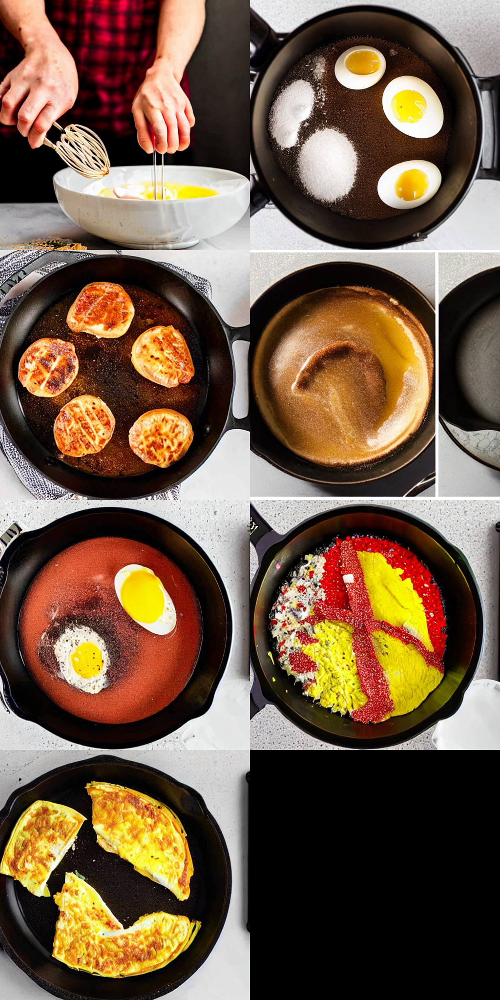

In [6]:
# prompts = [
#     "portrait photo of the oldest warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
#     "portrait photo of a old warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
#     "portrait photo of a warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
#     "portrait photo of a young warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
# ]
prompts = ["portrait photo of the Crack the eggs into a bowl and whisk until well combined",
           "Stir in the milk, salt, and pepper into the boil which contain crackked eggs in a bowl",
           "Heat a non-stick skillet over medium heat",
           'Add the butter or oil to the skillet and swirl to coat the bottom',
           "Pour the egg mixture into the skillet and tilt the pan to spread it evenly.",
           "Sprinkle the desired fillings over one half of the omelet.",
           "Using a spatula, fold the omelet in half and cook for another minute or two, or until the eggs are cooked through."
]

generator = [torch.Generator("cuda").manual_seed(1) for _ in range(len(prompts))]
images = pipeline(prompt=prompts, generator=generator, num_inference_steps=25).images
image_grid(images,rows=4, cols=2)  